# Nota

Este notebook serve para exercutar o código organizado nos diferentes ficheiros, usamos o `dev` para fazer o desenvolvimento pois é mais rápido para testar mas depois organizamos o código em diferentes ficheiros e fazemos as chamadas aqui em `main`.

In [10]:

#reload modules af
%load_ext autoreload
%autoreload 2

# Importing necessary libraries

import pandas as pd
import importlib

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
# Importing classes of the project
%load_ext autoreload
%autoreload 2


# Data Analysis Classes
from data_analysis.database import KagglehubSQLiteLoader
from data_analysis.analizer import TripDataAnalizer
from data_analysis.preprocessor import DataPreprocessor
from data_analysis.cleaner import DataCleaning

# EDA classes
from eda.eda import EDA
from eda.visualization import DataVisualization
from eda.featureAnalysis import FeatureAnalysis

# Statistical Analysis classes
from statistical_analysis.hypothesisTesting import HypothesisTesting

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
### Generate dataset to work with in following phases ###

# Load all 12 SQLite databases with data from all months
dataframes = []

for i in range(1,13):
    file = f"\\2019\\2019-{i:02}.sqlite"
    data = KagglehubSQLiteLoader("dhruvildave/new-york-city-taxi-trips-2019", file)

    # Random sample those databases to get a general sample with data from all of them
    df = data.get_table_dataframe_random_sample('tripdata', percentage=0.0001)
    dataframes.append(df)





Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-trips-2019\versions\4
Dataset downloaded Successfully 
Dataset saved on:  C:\Users\usoda\.cache\kagglehub\datasets\dhruvildave\new-york-city-taxi-

In [7]:
# Join all the samples in a single dataframe
df = pd.concat(dataframes, ignore_index=True)

df

,vendorid,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,ratecodeid,store_and_fwd_flag,pulocationid,dolocationid,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,congestion_surcharge
0,1.0,2019-01-01 00:49:42.000000,2019-01-01 00:57:59.000000,1.0,0.80,1.0,N,140.0,140.0,2.0,7.00,0.50,0.5,0.00,0.00,0.3,8.30,NaN
1,2.0,2019-01-01 00:44:07.000000,2019-01-01 00:51:47.000000,2.0,1.03,1.0,N,163.0,161.0,2.0,7.00,0.50,0.5,0.00,0.00,0.3,8.30,NaN
2,2.0,2019-01-01 01:27:24.000000,2019-01-01 01:33:36.000000,1.0,0.83,1.0,N,239.0,143.0,1.0,6.00,0.50,0.5,1.00,0.00,0.3,8.30,NaN
3,2.0,2019-01-01 01:19:17.000000,2019-01-01 01:38:27.000000,1.0,2.70,1.0,N,186.0,148.0,1.0,14.00,0.50,0.5,4.59,0.00,0.3,19.89,NaN
4,2.0,2019-01-01 02:10:27.000000,2019-01-01 02:27:19.000000,1.0,3.55,1.0,N,48.0,262.0,1.0,14.00,0.50,0.5,14.00,0.00,0.3,29.30,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8478,NaN,2019-12-08 06:54:10.000000,2019-12-08 07:03:25.000000,NaN,2.52,NaN,None,203.0,205.0,NaN,18.58,2.75,0.0,0.00,0.00,0.3,21.63,0.0
8479,NaN,2019-12-09 14:30:04.000000,2019-12-09 15:06:48.000000,NaN,2.77,NaN,None,143.0,90.0,NaN,22.45,2.75,0.0,0.00,0.00,0.3,25.50,0.0
8480,NaN,2019-12-17 04:56:28.000000,2019-12-17 05:30:52.000000,NaN,12.41,NaN,None,149.0,246.0,NaN,35.35,2.75,0.5,0.00,6.12,0.3,45.02,0.0
8481,NaN,2019-12-20 16:53:43.000000,2019-12-20 17:59:00.000000,NaN,11.42,NaN,None,87.0,124.0,NaN,45.68,2.75,0.0,0.00,0.00,0.3,48.73,0.0


In [8]:
# Apply Analysis
analizer = TripDataAnalizer(df, "fare_amount")

# Apply Preprocessing
preprocessor = DataPreprocessor(analizer, 16)

# Apply Clean up
cleaner = DataCleaning(analizer)



Feature columns extracted successfully.
Trip duration calculated successfully.
Average speed calculated successfully.
Data divided successfully.
Error: Input X contains infinity or a value too large for dtype('float64').


Dataset Info:

<class 'pandas.core.frame.DataFrame'>
Index: 6786 entries, 365 to 154
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   trip_distance         6786 non-null   float64
 1   trip_duration_min     6786 non-null   float64
 2   average_speed_mph     6786 non-null   float64
 3   tip_amount            6786 non-null   float64
 4   tolls_amount          6786 non-null   float64
 5   extra                 6786 non-null   float64
 6   passenger_count       6773 non-null   float64
 7   pickup_hour           6786 non-null   int32  
 8   pickup_day_of_week    6786 non-null   int32  
 9   pickup_day_of_month   6786 non-null   int32  
 10  pickup_month          6786 non-null   int32  
 11  dropoff_hour          6786 non-null   int32  
 12  dropoff_day_of_week   6786 non-null   int32  
 13  dropoff_day_of_month  6786 non-null   int32  
 14  dropoff_month         6786 non-null   int32  
 15  mta_tax   

<Figure size 1200x600 with 0 Axes>

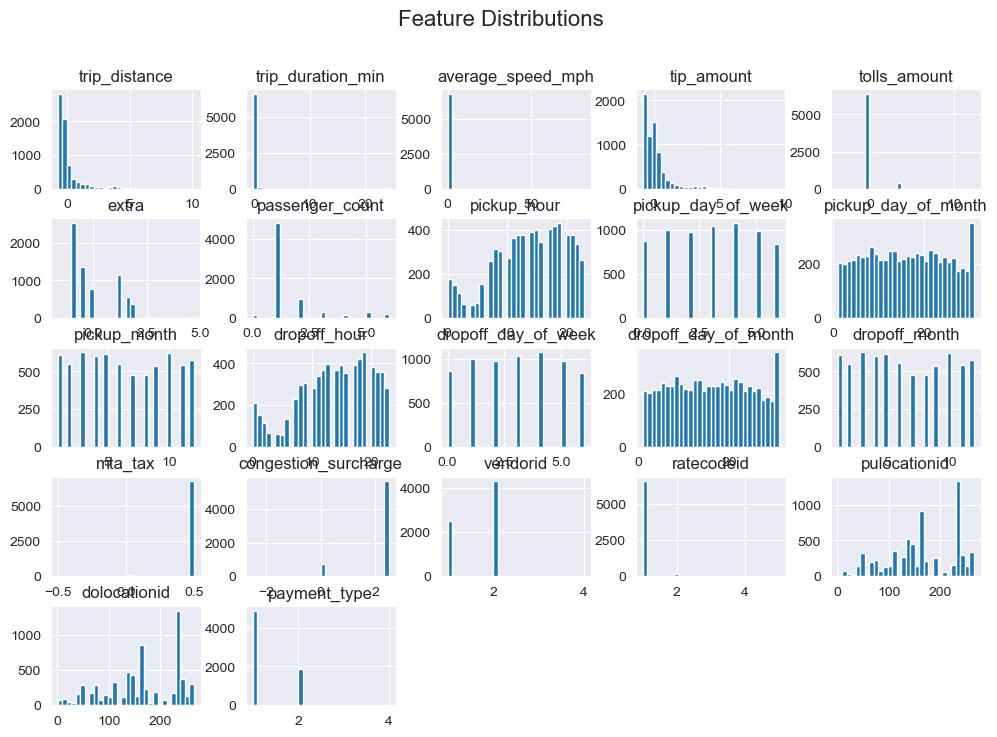

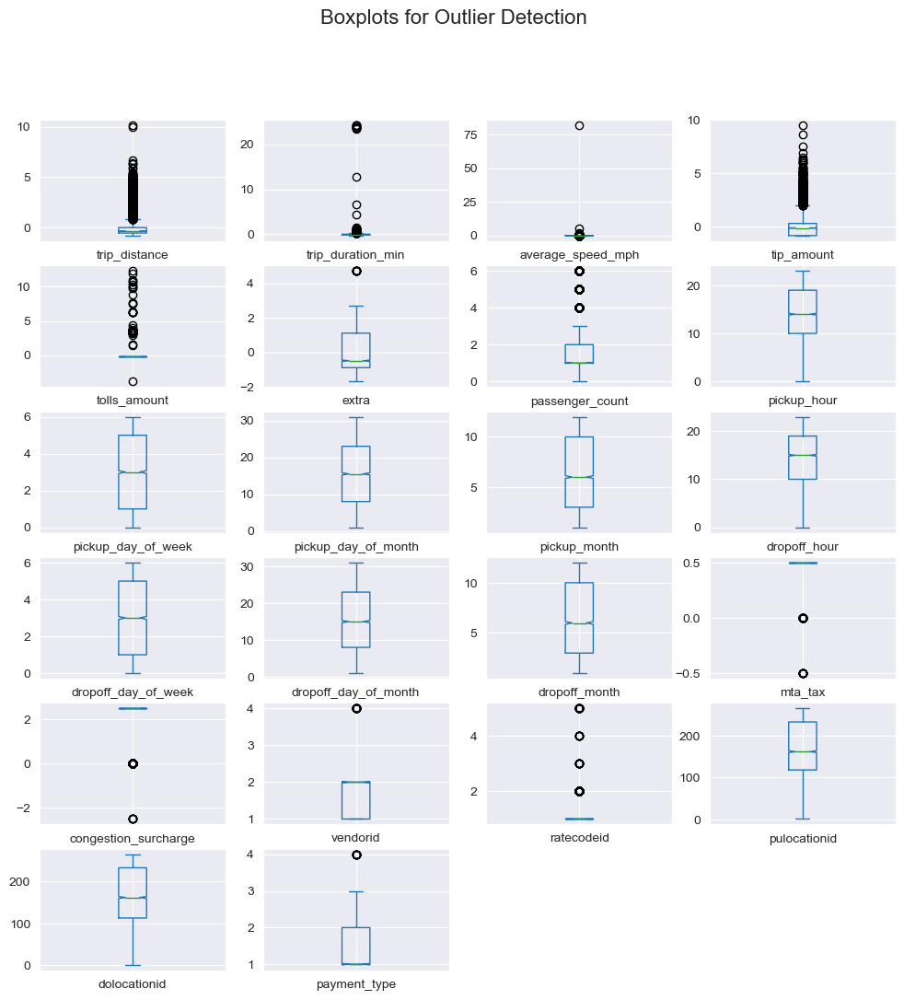

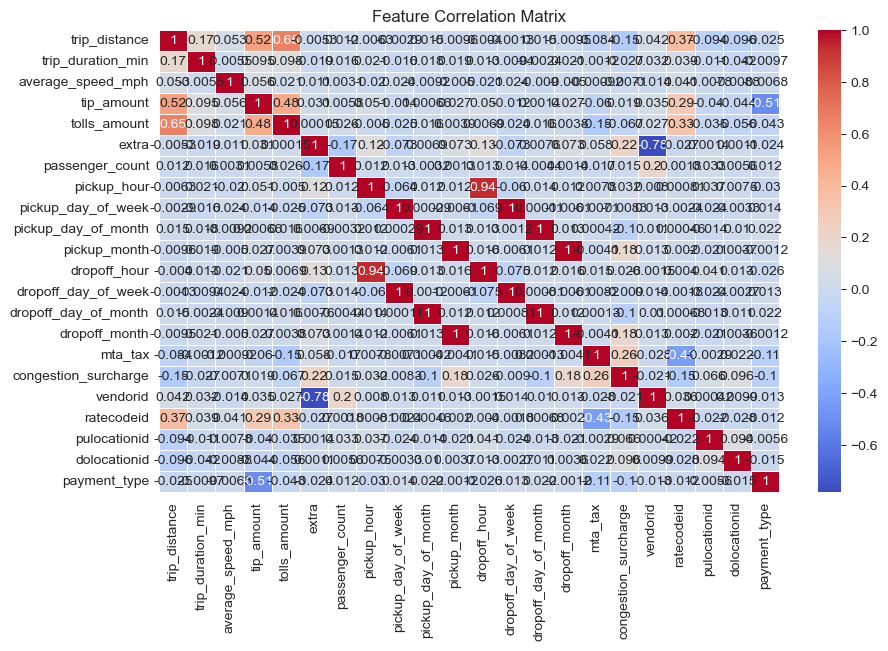

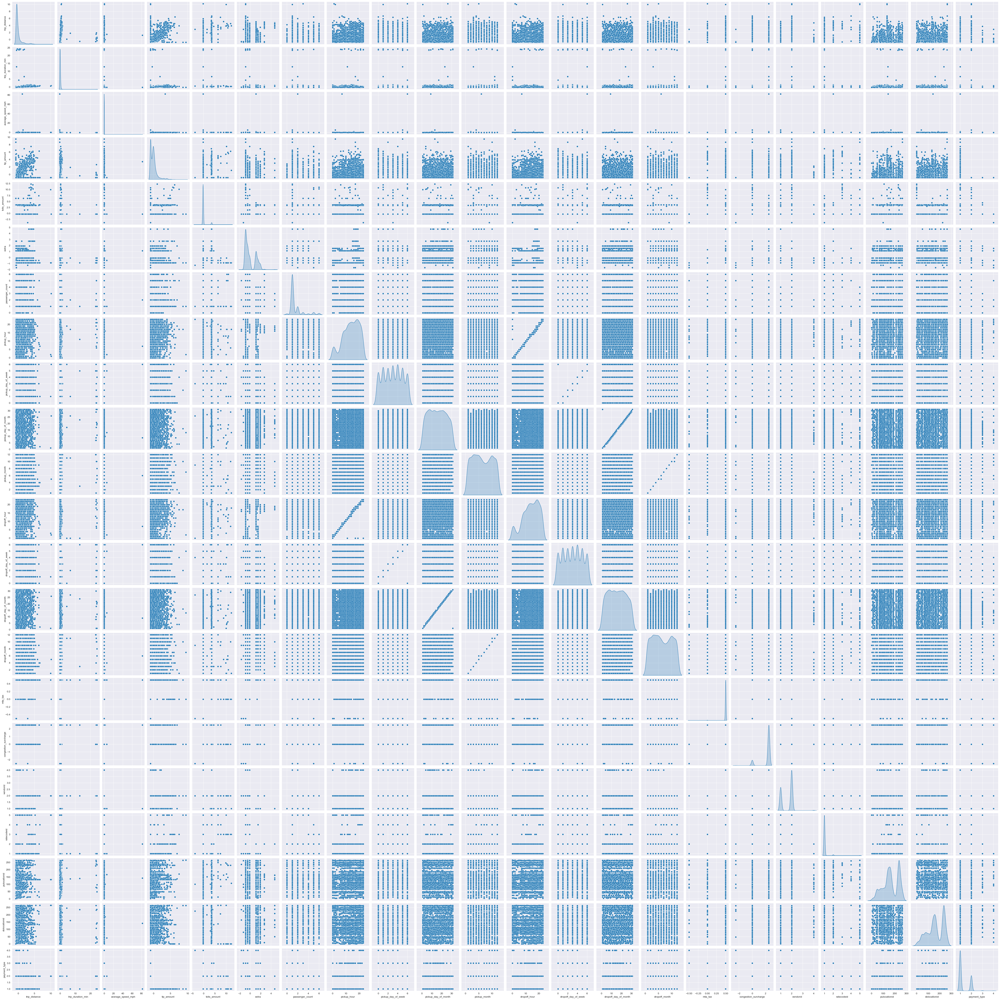

EDA completed successfully.


In [14]:
eda = EDA(analizer)

eda.run_eda()

Data Visualization Plots:
-------------------------

Pairplot:


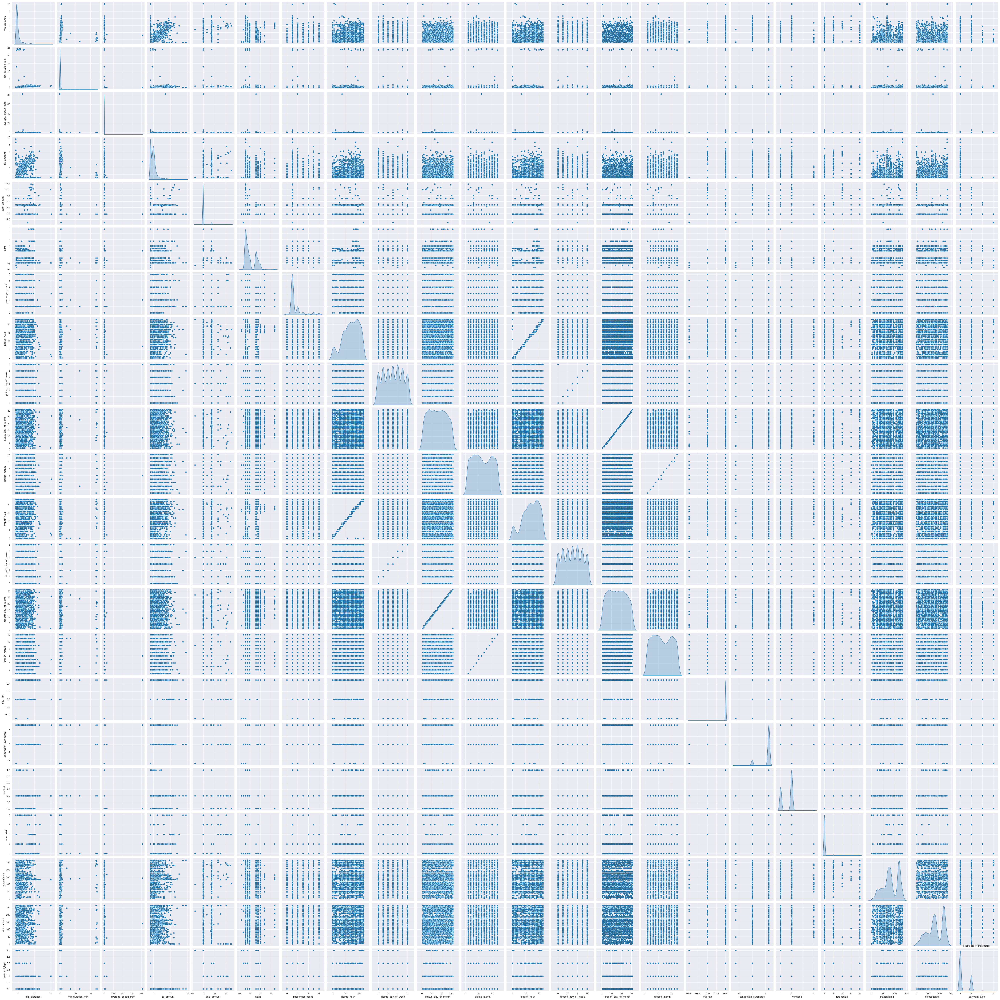


Boxplot:


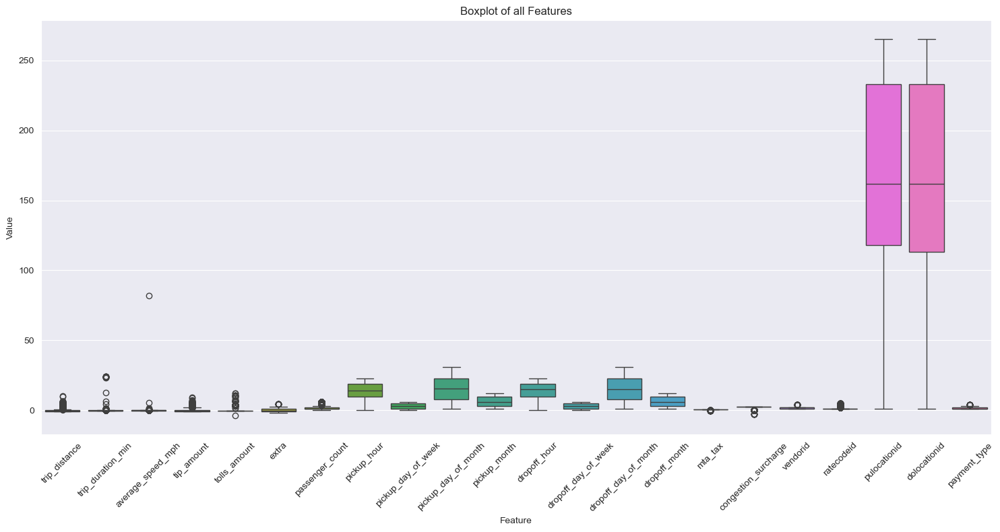


Ridgeplot:


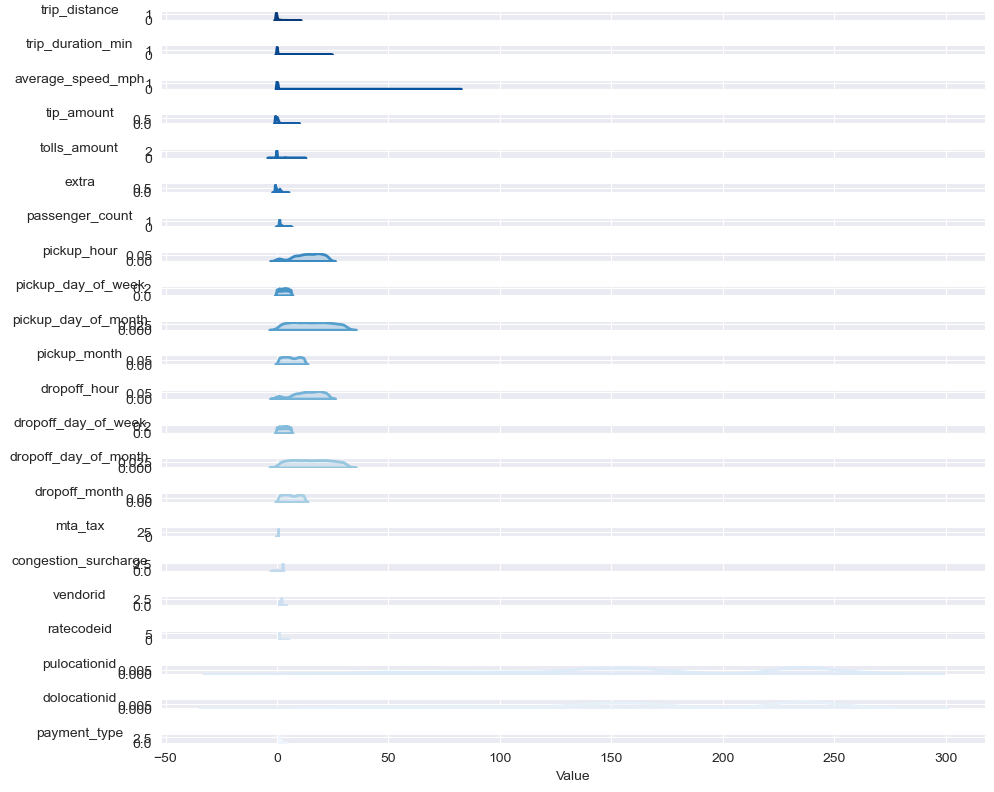

In [15]:
visualizer = DataVisualization(analizer)
visualizer.perform_visualization()